# Proyecto Pasta Loca

#### Equipo del Proyecto

El equipo detrás de este análisis está compuesto por:

- **Francesc Pujol Contreras**: *Data Engineer*. Responsable de la limpieza de bases de datos, creación de pipelines de datos y desarrollo de librerías utilizadas por los analistas.
  
- **Maria Alba Godoy Dominguez**: *Business Analyst - Credit Risk Management*. Encargada del análisis de morosidad y riesgos crediticios.

- **Alejandro Manzano**: *Business Analyst - Profitability Analysis*. Enfocado en el análisis de la rentabilidad del negocio.


## EDA

### Normalización de datos y validación

* Utilizamos info() para revisar la estructura y los tipos de datos del conjunto.
    * Los detalles concretos con shape, columns o dtypes.
* Explorar datos, fechas, nulos, columnas innecesarias
* Discusión sobre qué hacer con los datos de fechas que faltan (interpolcio o medias)

##### Mostrar la estructura de datos del dataset

In [28]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import itertools # Importando itertools para generar combinaciones de columnas
# Importando la función seasonal_decompose para la descomposición de series temporales
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.patches as mpatches
import payments_manager as pm
#pm.reset() #pm.help()
pm.init() #debug=True)
cr_cp = pm.df('cr_cp')
fe_cp = pm.df('fe_cp')
#cr_cp.info()
#fe_cp.info()

df_jo = pm.df('df_jo')
#df_jo.info()
df_jo = pm.sort("df_jo", ["id_cr"]).reset_index()
df_jo = df_jo.drop(columns=['index'])

#df_jo = df_jo.drop(columns=['Mes_created_at'])
df_jo_cp = df_jo.copy()
df_jo_cp['cr_received_date'] = df_jo_cp.cash_request_received_date
df_jo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32092 entries, 0 to 32091
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype          
---  ------                      --------------  -----          
 0   id_cr                       32092 non-null  int64          
 1   id_fe                       32092 non-null  int64          
 2   fe_cr_id                    21055 non-null  float64        
 3   user_id                     32092 non-null  int64          
 4   created_at                  32092 non-null  datetime64[ns] 
 5   created_at_fe               21055 non-null  datetime64[ns] 
 6   amount                      32092 non-null  float64        
 7   fee                         21055 non-null  float64        
 8   stat_cr                     32092 non-null  object         
 9   stat_fe                     21055 non-null  object         
 10  transfer_type               32092 non-null  object         
 11  type                        32092 non-nul

In [29]:
data_shape = cr_cp.shape
print(f"\nForma del DataFrame Cash Request (filas, columnas): {data_shape}")

column_names = cr_cp.columns
print(f"\nNombres de Columnas: {column_names}")
 
data_types = cr_cp.dtypes
print(f"\nTipos de datos de cada columna:\n{data_types}")


Forma del DataFrame Cash Request (filas, columnas): (23968, 23)

Nombres de Columnas: Index(['id', 'amount', 'status', 'created_at', 'updated_at', 'user_id',
       'moderated_at', 'deleted_account_id', 'reimbursement_date',
       'cash_request_received_date', 'money_back_date', 'transfer_type',
       'send_at', 'recovery_status', 'reco_creation', 'reco_last_update',
       'Mes_created_at', 'to_receive_ini', 'to_receive_bank', 'to_reimbur',
       'to_reimbur_cash', 'to_end', 'to_send'],
      dtype='object')

Tipos de datos de cada columna:
id                                      int64
amount                                float64
status                                 object
created_at                     datetime64[ns]
updated_at                     datetime64[ns]
user_id                                 int64
moderated_at                   datetime64[ns]
deleted_account_id                    float64
reimbursement_date             datetime64[ns]
cash_request_received_date     dat

In [30]:
data_shape = fe_cp.shape
print(f"\nForma del DataFrame Fees (filas, columnas): {data_shape}")

column_names = fe_cp.columns
print(f"\nNombres de Columnas: {column_names}")
 
data_types = fe_cp.dtypes
print(f"\nTipos de datos de cada columna:\n{data_types}")


Forma del DataFrame Fees (filas, columnas): (21057, 13)

Nombres de Columnas: Index(['id', 'cash_request_id', 'type', 'status', 'category', 'total_amount',
       'reason', 'created_at', 'updated_at', 'paid_at', 'from_date', 'to_date',
       'charge_moment'],
      dtype='object')

Tipos de datos de cada columna:
id                          int64
cash_request_id             int64
type                       object
status                     object
category                   object
total_amount              float64
reason                     object
created_at         datetime64[ns]
updated_at         datetime64[ns]
paid_at            datetime64[ns]
from_date          datetime64[ns]
to_date            datetime64[ns]
charge_moment              object
dtype: object


### Descripcion de los campos

#### Cash_Request (CR)

##### CR.Status (23970 registros)

- **money_back**: 16397 registros. El CR fue reembolsado exitosamente.
- **rejected**: 6568 registros. El CR necesitó una revisión manual y fue rechazado.
- **direct_debit_rejected**: 831 registros. El intento de débito directo SEPA falló.
- **active**: 59 registros. Los fondos fueron recibidos en la cuenta del cliente.
- **transaction_declined**: 48 registros. No se pudo enviar el dinero al cliente.
- **canceled**: 33 registros. El usuario no confirmó el CR en la app, fue cancelado automáticamente.
- **direct_debit_sent**: 34 registros. Se envió un débito directo SEPA, pero aún no se confirma el resultado.

| CR Status             | Regs(join y limpiar) |
| --------------------- | -------------------: |
| money_back            |                23268 |
| rejected              |                 6568 |
| direct_debit_rejected |                 1941 |
| active                |                  158 |
| direct_debit_sent     |                   74 |
| transaction_declined  |                   48 |
| canceled              |                   35 |


##### CR.Transfer Type

- **instant**: El usuario eligió recibir el adelanto instantáneamente.
- **regular**: El usuario eligió no pagar inmediatamente y esperar la transferencia.

| transfer_type | regs(join y limpiar) |
| ------------- | -------------------: |
| instant       |                19488 |
| regular       |                12604 |


##### CR.Recovery Status

- **null**: El CR nunca tuvo un incidente de pago.
- **completed**: El incidente de pago fue resuelto (el CR fue reembolsado).
- **pending**: El incidente de pago aún está abierto.
- **pending_direct_debit**: El incidente de pago sigue abierto, pero se ha lanzado un débito directo SEPA.

| recovery_status      | regs(join y limpiar) |
| -------------------- | -------------------: |
| nice (null)          |                24893 |
| completed            |                 5166 |
| pending              |                 1996 |
| pending_direct_debit |                   36 |
| cancelled            |                    1 |

#### Fees (FE)

##### FE.Type

- **instant_payment**: Fees por adelanto instantáneo.
- **split_payment**: Fees por pago fraccionado (en caso de un incidente).
- **incident**: Fees por fallos de reembolsos.
- **postpone**: Fees por la solicitud de posponer un reembolso.

| type            | regs(join y limpiar) |
| --------------- | -------------------: |
| instant_payment |                11095 |
| nice  (null)    |                11037 |
| postpone        |                 7765 |
| incident        |                 2195 |

##### FE.Status

- **confirmed**: El usuario completó una acción que creó un fee.
- **rejected**: El último intento de cobrar el fee falló.
- **cancelled**: El fee fue creado pero cancelado por algún motivo.
- **accepted**: El fee fue cobrado exitosamente.

| stat_fe   | regs(join y limpiar) |
| --------- | -------------------: |
| accepted  |                14839 |
| cancelled |                 4934 |
| rejected  |                 1194 |
| confirmed |                   88 |

##### FE.Category

- **rejected_direct_debit**: Fees creados cuando el banco del usuario rechaza el primer débito directo.
- **month_delay_on_payment**: Fees creados cada mes hasta que el incidente se cierre.
- **null**: No figura a la documentacio

| category               | regs(join y limpiar) |
| ---------------------- | -------------------: |
| nice  (null)           |                18860 |
| rejected_direct_debit  |                 1598 |
| month_delay_on_payment |                  597 |

##### FE.Charge Moment

- **before**: El fee se cobra en el momento de su creación.
- **after**: El fee se cobra cuando el CR es reembolsado.

| charge_moment | Regs(join y limpiar) |
| ------------- | -------------------: |
| after         |                16719 |
| before        |                 4336 |

### Limpieza de la base de datos

In [31]:
# filtros = ~df['cash_request_id'].isin(df['id_cr']) & df['cash_request_id'].notna()
# # Crear un nuevo DataFrame con los registros filtrados
# df_faltantes = df[filtros]
# # Mostrar los resultados
# print("Registros donde cash_request_id no existe en id_cr:")
# display(df_faltantes[['id_cr','cash_request_id','id_fe']])


# Filtrar valores no NaN en cash_request_id
#df_filtered = df[df['cash_request_id'].notna()]
#display(df_filtered[['id_cr','cash_request_id','id_fe']])

# # Filtrar registros donde cash_request_id no existe en id_cr
# df_missing = df_filtered[~df_filtered['cash_request_id'].isin(df['id_cr'])]

# # Mostrar los resultados
# print("Registros donde cash_request_id no existe en id_cr:")
# display(df_missing)

In [32]:
# Incoroprado en la libreria: Eliminar los Fees que apuntan cr_id inexistentes.

df_cr = pm.df('cr_cp')
df_fe = pm.df('fe_cp')
#df.info()

# Filtrar los registros donde cash_request_id no está en id_cr
# 21057
filtros = df_fe['cash_request_id'].isin(df_cr['id']) 
#display(filtros)


# Crear un nuevo DataFrame con los registros filtrados
df_faltantes = df_fe[filtros]

# Mostrar los resultados
print("Registros donde cash_request_id no existe en id_cr:")
display(df_faltantes)


Registros donde cash_request_id no existe en id_cr:


,id,cash_request_id,type,status,category,total_amount,reason,created_at,updated_at,paid_at,from_date,to_date,charge_moment
0,6537,14941,instant_payment,rejected,nice,5.0,Instant Payment Cash Request 14941,2020-09-07 10:47:27.423150,2020-10-13 14:25:09.396112,2020-12-17 14:50:07.470110,NaT,NaT,after
1,6961,11714,incident,accepted,rejected_direct_debit,5.0,rejected direct debit,2020-09-09 20:51:17.998653,2020-10-13 14:25:15.537063,2020-12-08 17:13:10.459080,NaT,NaT,after
2,16296,23371,instant_payment,accepted,nice,5.0,Instant Payment Cash Request 23371,2020-10-23 10:10:58.352972,2020-10-23 10:10:58.352994,2020-11-04 19:34:37.432910,NaT,NaT,after
3,20775,26772,instant_payment,accepted,nice,5.0,Instant Payment Cash Request 26772,2020-10-31 15:46:53.643958,2020-10-31 15:46:53.643982,2020-11-19 05:09:22.500223,NaT,NaT,after
4,11242,19350,instant_payment,accepted,nice,5.0,Instant Payment Cash Request 19350,2020-10-06 08:20:17.170432,2020-10-13 14:25:03.267983,2020-11-02 14:45:20.355598,NaT,NaT,after
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21056,12372,20262,instant_payment,rejected,nice,5.0,Instant Payment Cash Request 20262,2020-10-10 06:42:22.822743,2020-10-13 14:25:04.180490,2020-11-17 05:14:00.080854,NaT,NaT,after
21057,20768,26764,instant_payment,rejected,nice,5.0,Instant Payment Cash Request 26764,2020-10-31 15:24:18.680694,2020-10-31 15:24:18.680715,2020-12-16 07:10:54.697639,NaT,NaT,after
21058,18779,25331,instant_payment,rejected,nice,5.0,Instant Payment Cash Request 25331,2020-10-27 17:28:51.749177,2020-10-27 17:28:51.749200,2020-11-18 04:35:42.915511,NaT,NaT,after
21059,16542,23628,instant_payment,rejected,nice,5.0,Instant Payment Cash Request 23628,2020-10-23 16:27:52.047457,2020-10-23 16:27:52.047486,2020-12-18 05:18:01.465317,NaT,NaT,after


#### Casos de registros erroneos en los datos de origen

In [33]:
df_jo = pm.df('df_jo')
counts = df_jo['stat_cr'].value_counts()
display(counts)

counts = df_jo['transfer_type'].value_counts()
display(counts)

counts = df_jo['recovery_status'].value_counts()
display(counts)

#display(df_jo['to_reimbur_cash']) 

stat_cr
money_back               23268
rejected                  6568
direct_debit_rejected     1941
active                     158
direct_debit_sent           74
transaction_declined        48
canceled                    35
Name: count, dtype: int64

transfer_type
instant    19488
regular    12604
Name: count, dtype: int64

recovery_status
nice                    24893
completed                5166
pending                  1996
pending_direct_debit       36
cancelled                   1
Name: count, dtype: int64

In [34]:
counts = df_jo['type'].value_counts()
display(counts)

counts = df_jo['stat_fe'].value_counts()
display(counts)

counts = df_jo['category'].value_counts()
display(counts)

counts = df_jo['category'].value_counts()
display(counts)

counts = df_jo['charge_moment'].value_counts()
display(counts)

type
instant_payment    11095
nice               11037
postpone            7765
incident            2195
Name: count, dtype: int64

stat_fe
accepted     14839
cancelled     4934
rejected      1194
confirmed       88
Name: count, dtype: int64

category
nice                      18860
rejected_direct_debit      1598
month_delay_on_payment      597
Name: count, dtype: int64

category
nice                      18860
rejected_direct_debit      1598
month_delay_on_payment      597
Name: count, dtype: int64

charge_moment
after     16719
before     4336
Name: count, dtype: int64

#### Casos que no son outlayers, son errores seguro

In [35]:
# Casos que no son outlayers, son errores seguro

errors = df_jo[(df_jo['created_at']> df_jo['money_back_date']) | 
               (df_jo['created_at'] > df_jo['reimbursement_date'])]
# errors = df_jo[df_jo['created_at'].dt.date > df_jo['cash_request_received_date'].dt.date ]
# errors = df_jo[df_jo['created_at'].dt.date > df_jo['moderated_at'].dt.date]
#errors = df_jo[df_jo['to_send'].dt.total_seconds() < 0]

# Aquest no es un problema
# errors = df_jo[df_jo['to_end'].dt.total_seconds() < 0]
display(errors)
      
# Tiempo que la empresa recupera el dinero desde la primera accion.
cr_cp['to_reimbur'] = cr_cp.reimbursement_date-cr_cp.created_at

# Tiempo en el que la emprera realmente ha prestado el dinero
cr_cp['to_reimbur_cash'] = cr_cp.reimbursement_date-cr_cp.send_at

# Tiempo que la empresa presta el dinero.
cr_cp['to_end'] = cr_cp.reimbursement_date-cr_cp.money_back_date

# Tiempo que tarda en recibir el dinero el usuario desde la primera accion.
# cr_received_date  (cash_request_received_date) = ??
cr_cp['to_receive_ini'] = cr_cp.cash_request_received_date-cr_cp.created_at

# Tiempo que tarda en recibir el dinero el usuario desde que se envia (demora entre bancos).
cr_cp['to_receive_bank'] = cr_cp.cash_request_received_date-cr_cp.send_at

# En funcion del tipo instant o regular:
# TransfType: instant send_at - created_at =? 0 dias
# TransfType: regular send_at - created_at =? 7 dias
cr_cp['to_send'] = cr_cp.send_at-cr_cp.created_at

,id_cr,id_fe,fe_cr_id,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,...,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status,Mes_created_at,cash_request_received_date


## ANALISIS

### Visión global de datos

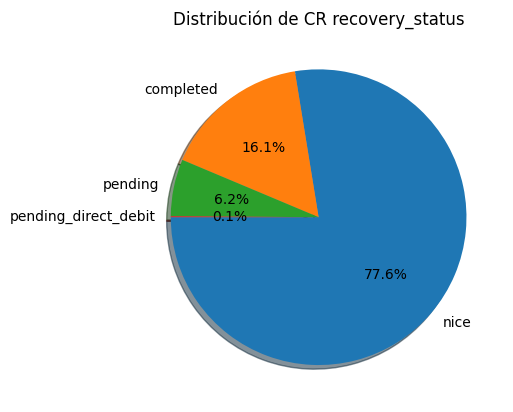

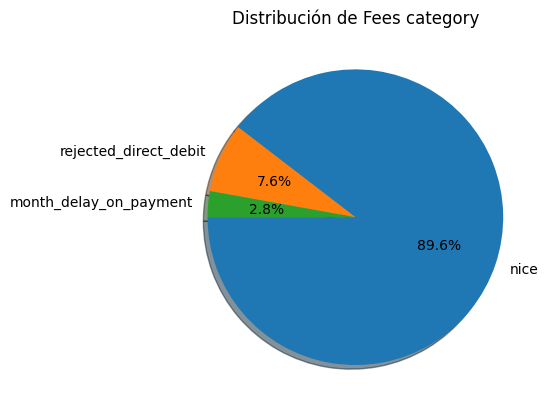

In [36]:
# #counts = cash_request[c].value_counts()
# #if len(counts)<=10:
c = 'recovery_status'
# counts = df_jo[c].value_counts()
# fig = px.pie(names=counts.index, values=counts.values, title=f'Distribución de {c}')
# fig.update_layout(height=500)
# fig.show()

p = df_jo['recovery_status'].value_counts().nlargest(4) # .sum().nlargest(8)   #df_cp[df_cp['region'].isin(region_largest)]
#p.info()
p.plot.pie(title= f"Distribución de {c}", legend=False, \
                   autopct='%1.1f%%', \
                   shadow=True, startangle=180)
plt.ylabel("") #plt.legend(loc='best'); plt.grid(True) # figsize=(12,6)
plt.title(f"Distribución de CR {c}")
plt.show()

c = 'category'
p = df_jo['category'].value_counts() #.nlargest(4) # .sum().nlargest(8)   #df_cp[df_cp['region'].isin(region_largest)]
#p.info()
p.plot.pie(title= f"Distribución de {c}", legend=False, \
                   autopct='%1.1f%%', \
                   shadow=True, startangle=180)
plt.ylabel("") #plt.legend(loc='best'); plt.grid(True) # figsize=(12,6)
plt.title(f"Distribución de Fees {c}")
plt.show()

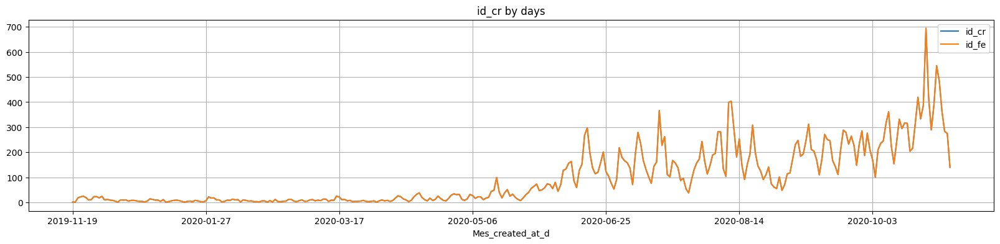

In [37]:
df_t = pm.df('df_jo')
df_t['Mes_created_at_d'] = df_t['created_at'].dt.to_period('d').astype(str)
df_t['Mes_created_at_w'] = df_t['created_at'].dt.to_period('W-WED').astype(str)
df_t['Mes_created_at_m'] = df_t['created_at'].dt.to_period('M').astype(str)
#df_jo.info()

#resultat = set.groupby(0)['index'].unique()
#fields = [v[0] for k, v in resultat.items()]
fields = ['id_cr','id_fe']

fig, ax= plt.subplots(figsize=(20,4))
plt.title('id_cr by days')
ratio_bag=df_t.groupby('Mes_created_at_d')[fields].count()
ratio_bag.plot(kind='line', ax=ax ) # ,color=['green', 'orange']
plt.grid()
plt.show()

#### Examinar casos de clientes concretos

* vips: 12934, 526
    * 90 Este se esta gestionando mal: todos instant, con demoras y sin gestion por 
    * 1946 Parece un ejemplo de buena gestion, al final tiene un instant y se le ha dado margen el las demoras.
    * 1987 Parece un ejemplo de buen usuario, se pasa a instant para siempre.

In [38]:
df = pm.df('df_jo')

cr_id = ['id_cr','id_fe','user_id', 'created_at','created_at_fe','amount','fee','stat_cr','stat_fe','transfer_type','type',
            'to_receive_ini', 'to_receive_bank','to_reimbur','to_reimbur_cash','to_end','to_send',
             'send_at', 'cr_received_date', 'money_back_date', 'reimbursement_date',
            'paid_at','charge_moment','moderated_at','reason','category','from_date','to_date', 'recovery_status'] # ,'id_y','from_date','to_date','reason','recovery_status', 'cash_request_id'

print("Casos segun Cash Request ID")
pd.options.display.max_columns = None
for id in ([23534]): # 16391 20108, 20104, 20112,
    df_t = df[df['id_cr'] == id].reset_index()
    print(f"Cash Request ID: {id}")
    display(df_t[cr_id].sort_values('created_at'))

user_ids = [21465] #[2002] #, 1987, 1946, 90, 526, 12934] #, 12274 54879 12441, 13851, 16391, 430,  63894,18730,10116,21465, 99000262]
# vips 12934 526
# 90 Este se esta gestionando mal: todos instant, con demoras y sin gestion por 
# 1946 Parece un ejemplo de buena gestion, al final tiene un instant y se le ha dado margen el las demoras.
# 1987 Parece un ejemplo de buen usuario, se pasa a instant para siempre.

pd.options.display.max_columns = None
print("Casos segun Cash User ID")
for id in (user_ids):
    #df_t = df[df['user_id'] == id].reset_index()
    df_t = df[(df['user_id'] == id) & (df['stat_cr'] == 'money_back')].reset_index()
    print(f"User ID: {id}")
    display(df_t[cr_id].sort_values('created_at').reset_index())

Casos segun Cash Request ID
Cash Request ID: 23534


,id_cr,id_fe,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status
0,23534,16460,21465,2020-10-23 15:20:26.163927,2020-10-23 15:21:35.895711,25.0,5.0,money_back,accepted,instant,instant_payment,NaT,NaT,18 days 08:30:33.836073,18 days 08:29:33.121475,4 days 16:34:38.154521,0 days 00:01:00.714598,2020-10-23 15:21:26.878525,2020-10-26 15:21:26.878525,2020-11-06 07:16:21.845479,2020-11-10 23:51:00,2020-11-06 07:16:22.014422,after,NaT,Instant Payment Cash Request 23534,nice,NaT,NaT,nice


Casos segun Cash User ID
User ID: 21465


,index,id_cr,id_fe,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status
0,0,23534,16460,21465,2020-10-23 15:20:26.163927,2020-10-23 15:21:35.895711,25.0,5.0,money_back,accepted,instant,instant_payment,NaT,NaT,18 days 08:30:33.836073,18 days 08:29:33.121475,4 days 16:34:38.154521,0 days 00:01:00.714598,2020-10-23 15:21:26.878525,2020-10-26 15:21:26.878525,2020-11-06 07:16:21.845479,2020-11-10 23:51:00,2020-11-06 07:16:22.014422,after,NaT,Instant Payment Cash Request 23534,nice,NaT,NaT,nice


#### Calcular la medias:

* 2,94 dias de demora promedio en las transferencias bancarias
* 31.6: Promedio del tiempo que tarda la empresa en cobrar los fee

In [39]:
pd.options.display.max_columns = None
df = pm.df('df_jo')
# Calcular la medias:

# 2,94 dias de demora promedio en las transferencias bancarias
print(df['to_receive_bank'].dt.days.mean())
#x = df['to_b2b_delay'] = (df.cr_received_date-df.send_at).dt.days
#display(x.notna().mean())
#display(df['to_b2b_delay'])# .mean()

# 31.6: Promedio del tiempo que tarda la empresa en cobrar los fee
df['to_fee_paid_delay'] = (df.paid_at -df.created_at).dt.days
x =  df[(df['to_fee_paid_delay'].notna()) & (df['stat_cr'] == 'money_back')]
display(x.to_fee_paid_delay.mean())


-2.9449404761904763


np.float64(31.65246496060247)

#### Identificar datos erroneos e incorporarlos en la libreria:

In [40]:
import payments_manager as pm
import pandas as pd
pd.options.display.max_columns = None
df = pm.df('df_jo')

# send_at mirar si tiene registros faltantes.
# money_back_date

#0 registros
#display(df[ (df['reimbursement_date'].isna()) & (df['stat_cr'] == 'money_back') ])


#191 registros
#display(df[ ((df['reimbursement_date'].isna()) | (df['money_back_date'].isna())) & (df['stat_cr'] == 'money_back') ])

#191 Normalizamos:
display(df[ (df['money_back_date'].isna()) & (df['stat_cr'] == 'money_back') ])
df['money_back_date'] = df.apply(
            lambda row: row['reimbursement_date']             
            if ( pd.isna(row['money_back_date']) & (row['stat_cr'] == 'money_back') ) 
            else row['money_back_date'], axis=1)
display(df[ (df['money_back_date'].isna()) & (df['stat_cr'] == 'money_back') ])

# 838  registros
#display(df[ (df['reimbursement_date'].notna()) & (df['money_back_date'].notna() & (df['stat_cr'] != 'money_back') )])#.head(5).reset_index()

,id_cr,id_fe,fe_cr_id,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status,Mes_created_at,cash_request_received_date


,id_cr,id_fe,fe_cr_id,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status,Mes_created_at,cash_request_received_date


In [ ]:
pd.options.display.max_columns = None
df = pm.df('df_jo')

# Normalizamos
# 1219 estos los ponemos a +3 dias (promedio 2,94 dias)
# cr_received_date a 'send_at' +3 dias
display(df[ (df['send_at'].notna()) & (df['cr_received_date'].isna() & (df['stat_cr'] == 'money_back') )])#.head(5).reset_index()
df['cr_received_date'] = df.apply(
            lambda row: row['send_at']+ pd.DateOffset(days=3) 
            if ( pd.isna(row['cr_received_date']) & (row['stat_cr'] == 'money_back') ) 
            else row['cr_received_date'], axis=1
        )
display(df[ (df['send_at'].notna()) & (df['cr_received_date'].isna() & (df['stat_cr'] == 'money_back') )])#.head(5).reset_index()

# 5960 estos los ponemos a -3 dias (promedio 2,94 dias)
#display(df[ (df['send_at'].isna()) & (df['cr_received_date'].notna() & (df['stat_cr'] == 'money_back') )])#.head(5).reset_index()

# 8177 Casos
#display(df[ (df['reimbursement_date'].isna()) | (df['money_back_date'].isna())  ])#.head(5).reset_index()

# Casos a interpolar:
#ratio_bag=df.groupby('Mes_created_at_d')[['amount', 'fee']].mean()
#display(ratio_bag)

# df['reimbursement_date'] = df.apply(
#             lambda row: row['money_back_date'] if not pd.isna(row['money_back_date']) else row['reimbursement_date'], axis=1
#         )

,id_cr,id_fe,fe_cr_id,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status,Mes_created_at,cash_request_received_date


,id_cr,id_fe,fe_cr_id,user_id,created_at,created_at_fe,amount,fee,stat_cr,stat_fe,transfer_type,type,to_receive_ini,to_receive_bank,to_reimbur,to_reimbur_cash,to_end,to_send,send_at,cr_received_date,money_back_date,reimbursement_date,paid_at,charge_moment,moderated_at,reason,category,from_date,to_date,recovery_status,Mes_created_at,cash_request_received_date


### Segmentacion

#### Por ID de Cash Request

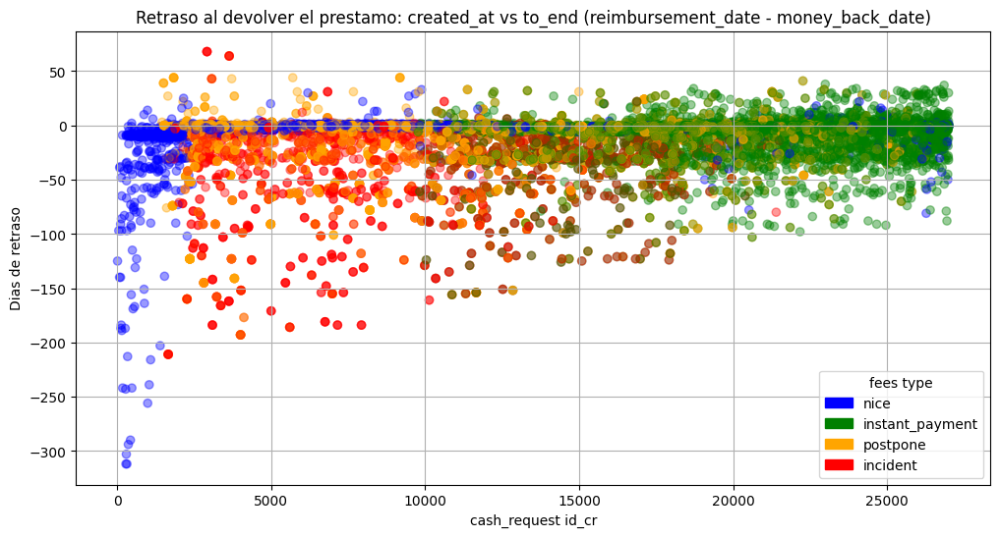

In [42]:
df = pm.df('df_jo')
classification_colors = {'nice': 'blue', 'instant_payment':'green', 'postpone':'orange', 'incident':'red'}
#df['created_at_w'] = df['created_at']# .dt.to_period('W').astype(str)
df= df.dropna(subset=['to_end'])
#df= df.dropna(subset=['type'])
x_values = df['id_cr']
y_values = df['to_end'].dt.days # .astype('int')
c_values= list(df['type'].map(classification_colors))
fig, ax= plt.subplots(figsize=(12,6))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = .4)
plt.title('Retraso al devolver el prestamo: created_at vs to_end (reimbursement_date - money_back_date)')
plt.xlabel('cash_request id_cr')
plt.ylabel('Dias de retraso')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.grid()
plt.show()

#### Por fecha creacion de registro de Cash Request

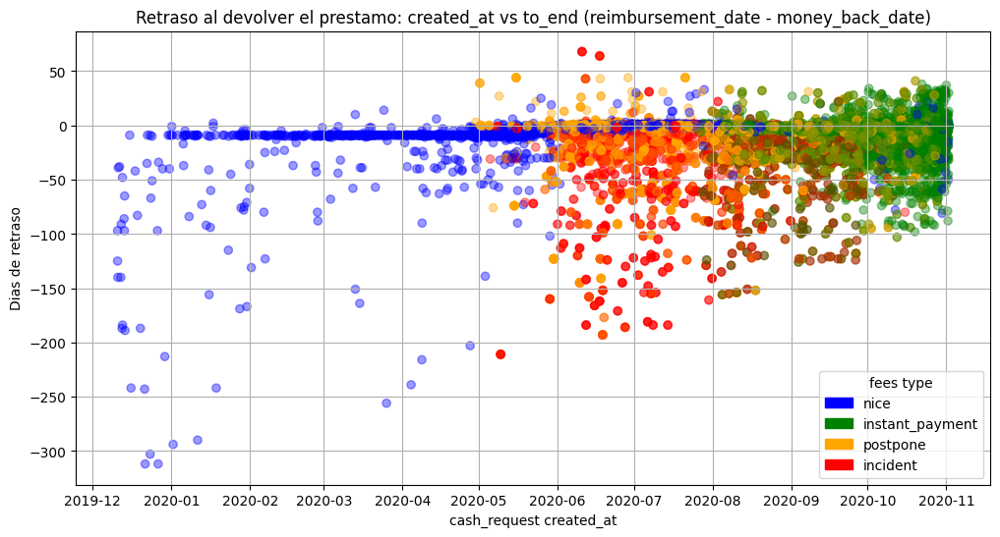

In [43]:
df = pm.df('df_jo')
classification_colors = {'nice': 'blue', 'instant_payment':'green', 'postpone':'orange', 'incident':'red'}
#df['created_at_w'] = df['created_at']# .dt.to_period('W').astype(str)
df= df.dropna(subset=['to_end'])
#df= df.dropna(subset=['type'])
x_values = df['created_at'] #'id_cr']
y_values = df['to_end'].dt.days # .astype('int')
c_values= list(df['type'].map(classification_colors))
fig, ax= plt.subplots(figsize=(12,6))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = .4)
plt.title('Retraso al devolver el prestamo: created_at vs to_end (reimbursement_date - money_back_date)')
plt.xlabel('cash_request created_at')
plt.ylabel('Dias de retraso')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.grid()
plt.show()

#### Por fecha creacion de registro de Cash Request (Escala logaritmica)

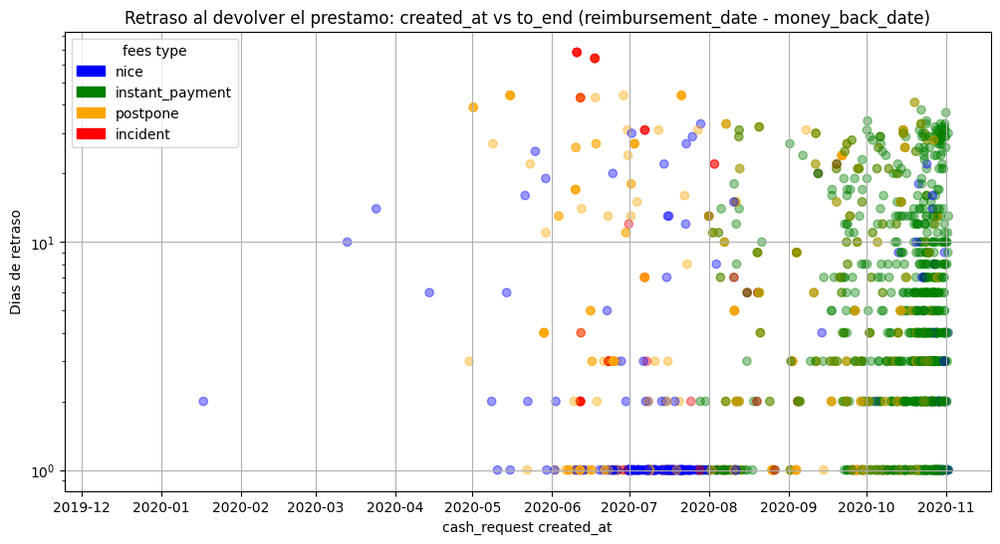

In [44]:
df = pm.df('df_jo')
classification_colors = {'nice': 'blue', 'instant_payment':'green', 'postpone':'orange', 'incident':'red'}
#df['created_at_w'] = df['created_at']# .dt.to_period('W').astype(str)
df= df.dropna(subset=['to_end'])
#df= df.dropna(subset=['type'])
x_values = df['created_at'] #'id_cr']
y_values = df['to_end'].dt.days # .astype('int')
c_values= list(df['type'].map(classification_colors))
fig, ax= plt.subplots(figsize=(12,6))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = .4)
plt.title('Retraso al devolver el prestamo: created_at vs to_end (reimbursement_date - money_back_date)')
plt.xlabel('cash_request created_at')
plt.ylabel('Dias de retraso')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.yscale('log')
plt.grid()
plt.show()

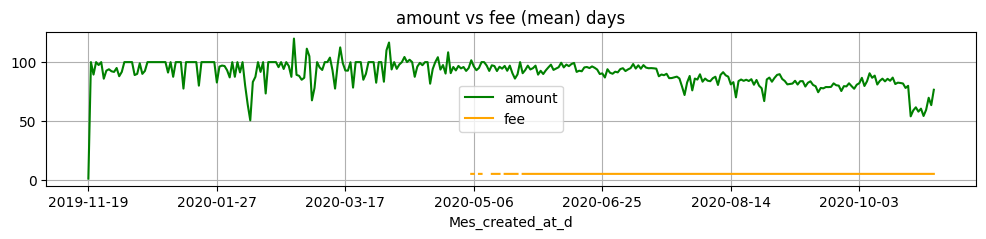

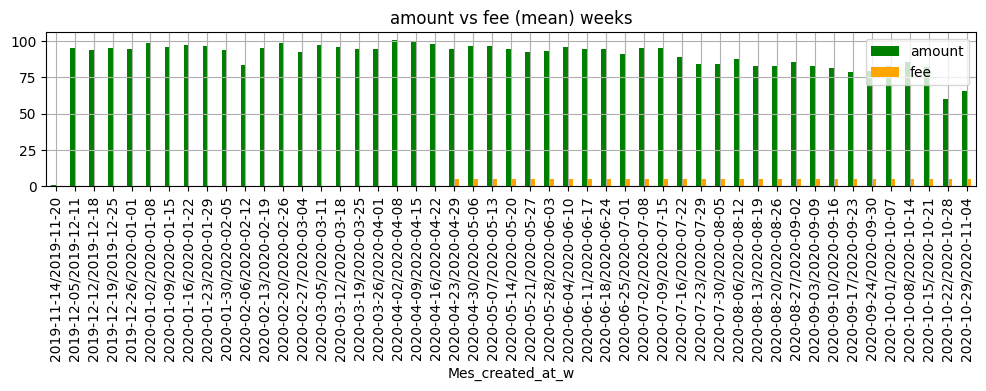

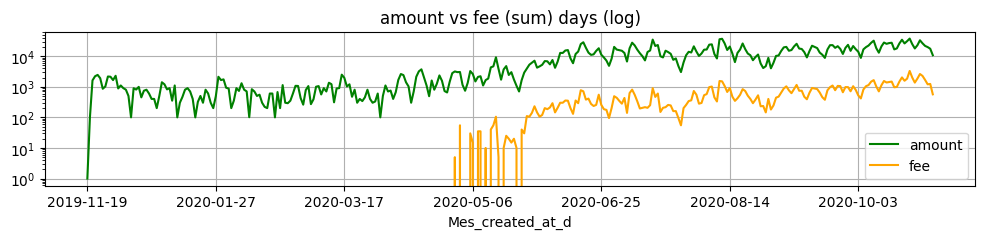

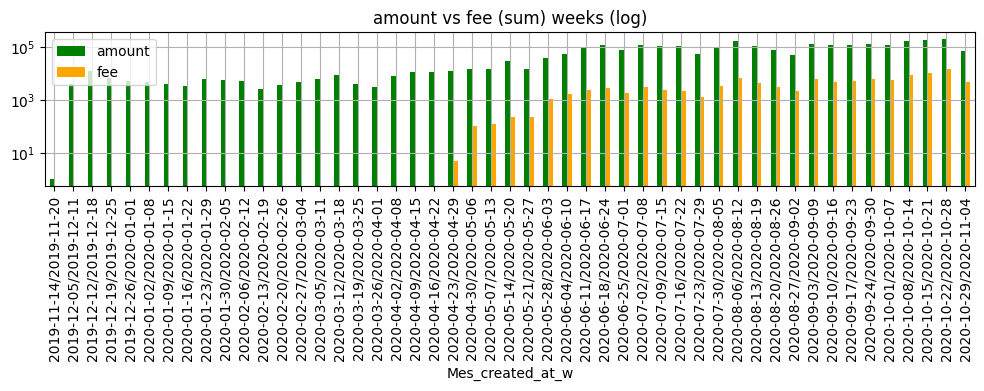

In [45]:
df_t = pm.df('df_jo')
df_t['Mes_created_at_d'] = df_t['created_at'].dt.to_period('d').astype(str)
df_t['Mes_created_at_w'] = df_t['created_at'].dt.to_period('W-WED').astype(str)
df_t['Mes_created_at_m'] = df_t['created_at'].dt.to_period('M').astype(str)

fig, ax= plt.subplots(figsize=(12,2))
plt.title('amount vs fee (mean) days')
ratio_bag=df_t.groupby('Mes_created_at_d')[['amount', 'fee']].mean()
ratio_bag.plot(kind='line', color=['green', 'orange'],ax=ax )
plt.grid()
plt.show()

fig, ax= plt.subplots(figsize=(12,2))
plt.title('amount vs fee (mean) weeks')
ratio_bag=df_t.groupby('Mes_created_at_w')[['amount', 'fee']].mean()
ratio_bag.plot(kind='bar', color=['green', 'orange'],ax=ax )
plt.grid()
plt.show()

fig, ax= plt.subplots(figsize=(12,2))
plt.title('amount vs fee (sum) days (log)')
ratio_bag=df_t.groupby('Mes_created_at_d')[['amount', 'fee']].sum()
ratio_bag.plot(kind='line', color=['green', 'orange'],ax=ax )
plt.yscale('log')
plt.grid()
plt.show()

fig, ax= plt.subplots(figsize=(12,2))
plt.title('amount vs fee (sum) weeks (log)')
ratio_bag=df_t.groupby('Mes_created_at_w')[['amount', 'fee']].sum()
ratio_bag.plot(kind='bar', color=['green', 'orange'],ax=ax )
plt.yscale('log')
plt.grid()
plt.show()

#### Importes de los prestamos

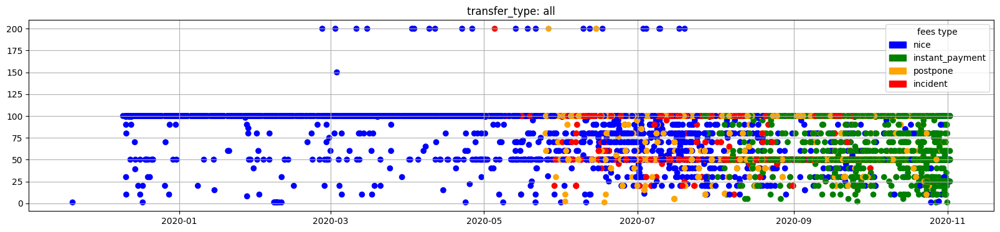

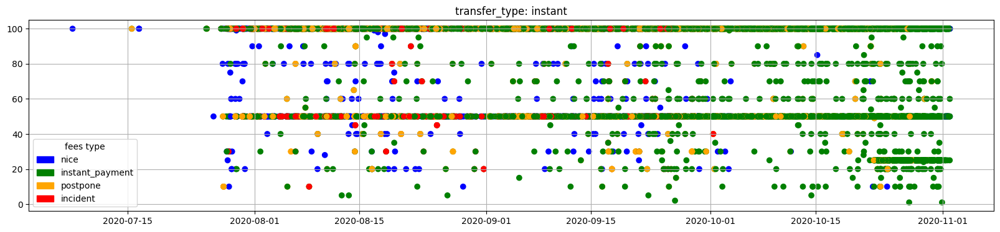

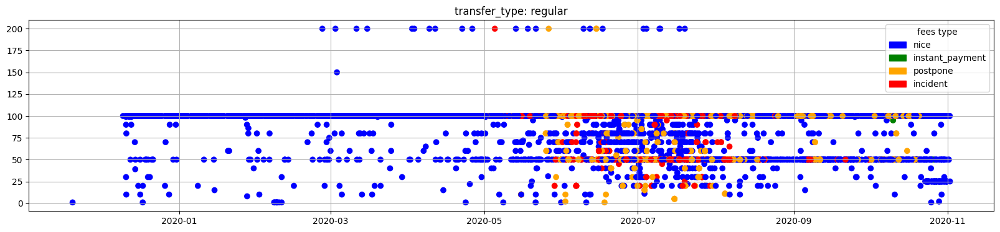

In [46]:
classification_colors = {'nice': 'blue', 'instant_payment':'green', 'postpone':'orange', 'incident':'red'}
df_t = pm.df('df_jo')
#df_t= df.dropna(subset=['type'])

#df_t['created_at_w'] = df_t['created_at']# .dt.to_period('W').astype(str)
df_filter = df_t
fig, ax= plt.subplots(figsize=(20,4))
x_values = df_filter['created_at']
y_values = df_filter['amount'] # fee
c_values= list(df_filter['type'].map(classification_colors))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = 1.)
plt.title('transfer_type: all')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.grid()
plt.show()

df_t['created_at_w'] = df_t['created_at']# .dt.to_period('W').astype(str)
df_filter = df_t[df_t['transfer_type']=='instant']
#display(df_filter)
fig, ax= plt.subplots(figsize=(20,4))
x_values = df_filter['created_at_w']
y_values = df_filter['amount'] # fee
c_values= list(df_filter['type'].map(classification_colors))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = 1.)
plt.title('transfer_type: instant')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.grid()
plt.show()

df_t['created_at_w'] = df_t['created_at']# .dt.to_period('W').astype(str)
df_filter = df_t[df_t['transfer_type']=='regular']
#display(df_filter)
fig, ax= plt.subplots(figsize=(20,4))
x_values = df_filter['created_at_w']
y_values = df_filter['amount'] # fee
c_values= list(df_filter['type'].map(classification_colors))
plt.scatter(x= x_values, y= y_values, c=c_values, alpha = 1.)
plt.title('transfer_type: regular')
legend_patches = [mpatches.Patch(color=color, label=type) for type, color in classification_colors.items()]
plt.legend(handles=legend_patches, loc='best', title ='fees type') #upper right')
plt.grid()
plt.show()

### Mapas de calor: Cash Request join Fees

In [47]:
#cash_request=pd.read_csv('../data/extract - cash request - data analyst.csv')
#fees=pd.read_csv('../data/extract - fees - data analyst - .csv')
df_jo = pm.df('df_jo')

fig1 = px.imshow(df_jo.isnull(),
color_continuous_scale=['black', 'red'],
labels=dict(color="NaN"),
title="Mapa de calor para cash_request join fees")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

### Correlaciones

##### Correlaciones descartando columnas auxiliares de fechas

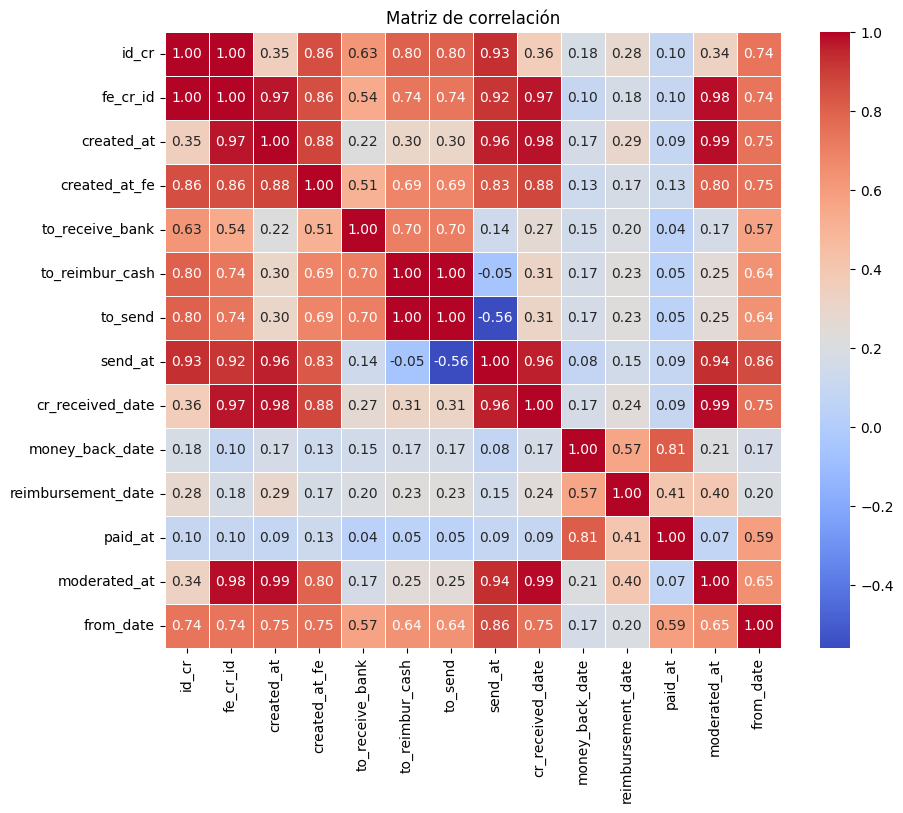

Variables altamente correlacionadas con otras:


['id_cr',
 'fe_cr_id',
 'created_at',
 'created_at_fe',
 'to_reimbur_cash',
 'to_send',
 'send_at',
 'cr_received_date',
 'money_back_date',
 'paid_at',
 'moderated_at',
 'from_date']

In [48]:
df = pm.df('df_jo')
df = df.drop(columns=['cash_request_received_date'])

#df = df.drop(columns=['active'])

df = df.drop(columns=['Mes_created_at'])
df = df.drop(columns=['fee']) #df = df.drop(columns=['total_amount'])
df = df.drop(columns=['amount'])
df = df.drop(columns=['user_id'])
df = df.drop(columns=['id_fe'])

df = df.drop(columns=['to_date'])
df = df.drop(columns=['to_reimbur'])
df = df.drop(columns=['to_receive_ini'])
df = df.drop(columns=['to_end'])

d_list = list(df.select_dtypes(include=['datetime64']).columns)
for date in d_list:
    df[date] = pd.to_datetime(df[date]).dt.strftime('%Y%m%d').astype(float)
df_corr = df.select_dtypes(include=['number'])
matriz_corr = df_corr.corr()
plt.figure(figsize=(10, 8)) 
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=0.5)
plt.title('Matriz de correlación')
plt.show()

# Identificar columnas con correlación alta (umbral = 0.8)
threshold = 0.8
to_drop = []
for column in matriz_corr.columns:
    if any((matriz_corr[column].abs() > threshold) & (matriz_corr.index != column)):
        to_drop.append(column)
print(f"Variables altamente correlacionadas con otras:")
display(to_drop)

##### Correlaciones descartando columnas auxiliares de fechas

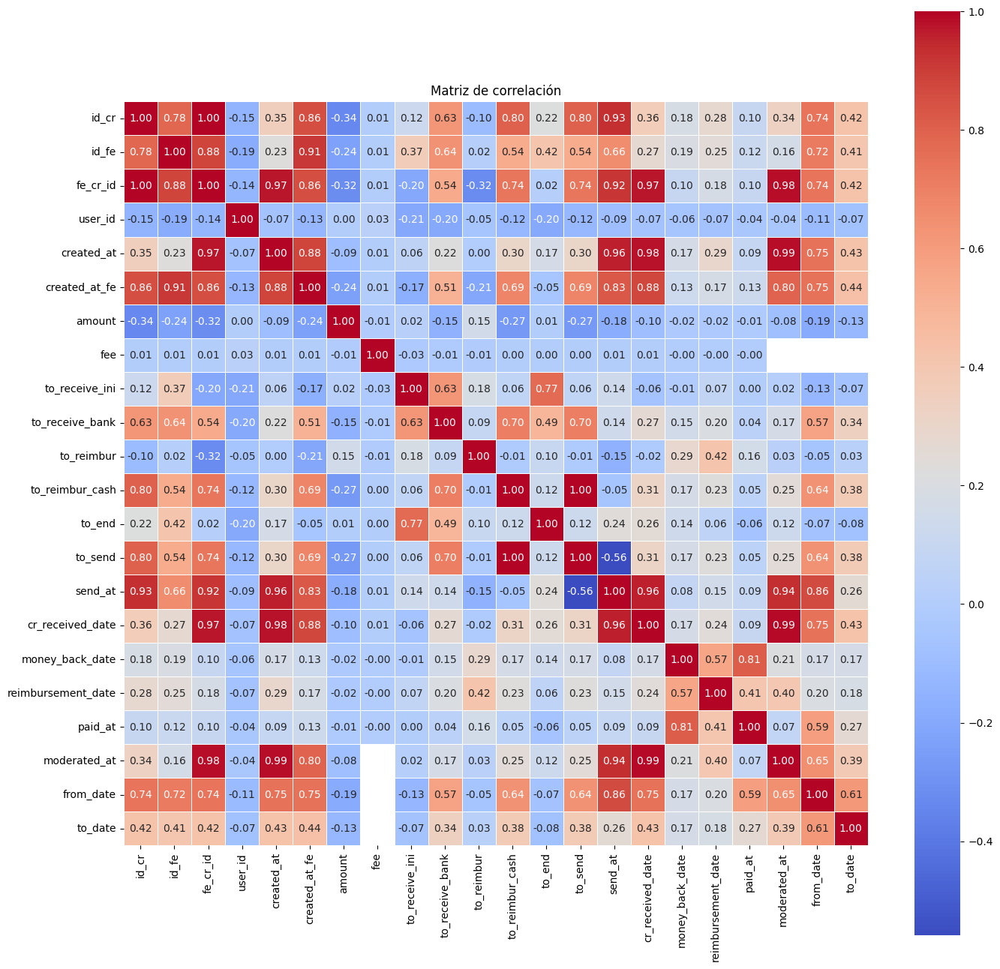

Variables altamente correlacionadas con otras:


['id_cr',
 'id_fe',
 'fe_cr_id',
 'created_at',
 'created_at_fe',
 'to_reimbur_cash',
 'to_send',
 'send_at',
 'cr_received_date',
 'money_back_date',
 'paid_at',
 'moderated_at',
 'from_date']

In [49]:
df = pm.df('df_jo')
df = df.drop(columns=['cash_request_received_date'])

d_list = list(df.select_dtypes(include=['datetime64']).columns)
for date in d_list:
    df[date] = pd.to_datetime(df[date]).dt.strftime('%Y%m%d').astype(float)
df_corr = df.select_dtypes(include=['number'])
matriz_corr = df_corr.corr()
plt.figure(figsize=(16, 16)) 
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=0.5)
plt.title('Matriz de correlación')
plt.show()

# Identificar columnas con correlación alta (umbral = 0.8)
threshold = 0.8
to_drop = []
for column in matriz_corr.columns:
    if any((matriz_corr[column].abs() > threshold) & (matriz_corr.index != column)):
        to_drop.append(column)
print(f"Variables altamente correlacionadas con otras:")
display(to_drop)

### Analisis de Series Temporales y Ruido asociado

Observaciones:

* Se aprecia un aspecto semanal de los datos al ver la evolucion a la lo largo de los ultimos 6 meses.

TODO:

In [50]:
df_cp = pm.df('df_jo')
#print(f"Ragos de fechas: mínima: {df_cp.Date.min()} máxima: {df_cp.Date.max()}")
df_grouped = df_cp.groupby('Created_at')['amout'].mean()

# Descomposicio de la serie de tiemps: 39 mesos si considerem que tenim del 1-1-2015 fins al 25-3-2018
df_decomp = seasonal_decompose(df_grouped, model='additive', period=(int)(52*1)) #maxim: 84

plt.figure(figsize=(10, 2))
plt.plot(df_decomp.observed, label='')
plt.legend(loc='best');plt.grid(True)
#plt.title('Tendencia')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 2))
plt.plot(df_decomp.trend, color='red', label='Tendencia mensual')
plt.legend(loc='best');plt.grid(True)
#plt.title('Tendencia')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 2))
plt.plot(df_decomp.seasonal, label='Estacionalidad')
plt.legend(loc='best');plt.grid(True)
#plt.title('Estacionalidad')
plt.tight_layout()
plt.show()

KeyError: 'Created_at'

### Gráficos para Visualización de Datos

##### Volumen Total

##### Promedios por Mes

### Histogramas